# Import Dependencies

In [119]:
import numpy as np
import pandas as pd
import gzip
import json

from pprint import pprint

In [120]:
#@title Turkish StopWords

import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
turkish_stopwords = stopwords.words('turkish')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\aarda\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Influencer Category Classification



1.   Read Data
2.   Preprocess Data
3.   Prepare Model
4.   Predict Test Data
4.   Save outputs



In [79]:
import pandas as pd

# Load the dataset with error handling and logging
try:
    train_classification_df = pd.read_csv("train-classification.csv")
except FileNotFoundError as e:
    print("Error: The file was not found.")
    raise e
except pd.errors.EmptyDataError as e:
    print("Error: The file is empty.")
    raise e
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    raise e

# Rename columns with more precise handling
train_classification_df.rename(columns={'Unnamed: 0': 'user_id', 'label': 'category'}, inplace=True)

# Check and handle any missing values in critical columns
missing_values = train_classification_df.isnull().sum()
if missing_values.any():
    print(f"Warning: Missing values detected in the following columns:\n{missing_values}")
    # Optional: Handle missing values, for instance, by filling them with a placeholder or dropping rows
    train_classification_df = train_classification_df.dropna(subset=['user_id', 'category'])

# Unify labels by converting to lowercase
train_classification_df['category'] = train_classification_df['category'].apply(lambda x: str(x).lower())

# Create the username-to-category dictionary
username2_category = train_classification_df.set_index('user_id')['category'].to_dict()

# Optionally log the result for debugging
print(f"Loaded and processed {len(train_classification_df)} user entries with unique categories.")


Loaded and processed 2742 user entries with unique categories.


Label Distribution:
               category  count
0                  food    511
1  health and lifestyle    503
2                  tech    346
3         entertainment    323
4               fashion    299
5                travel    294
6                   art    191
7      mom and children    149
8                sports    113
9                gaming     13


C:\Users\aarda\AppData\Local\Temp\ipykernel_16940\3128718127.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='category', y='count', data=label_stats, palette='Blues_d')


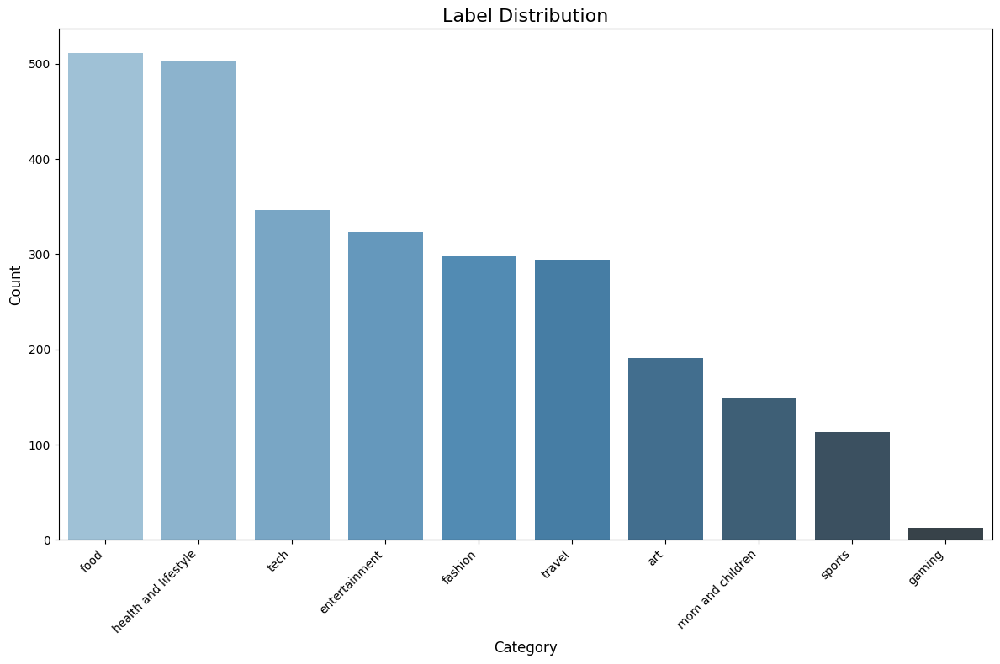

In [121]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate label distribution efficiently
label_stats = train_classification_df['category'].value_counts().reset_index()
label_stats.columns = ['category', 'count']
label_stats = label_stats.sort_values(by='count', ascending=False)

# Display label distribution stats
print("Label Distribution:")
print(label_stats)

# Optional: Visualize the distribution with advanced plotting
try:
    plt.figure(figsize=(12, 8))  # Adjust size for readability
    sns.barplot(x='category', y='count', data=label_stats, palette='Blues_d')
    plt.title("Label Distribution", fontsize=16)
    plt.xlabel("Category", fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.tight_layout()
    plt.show()
except ImportError:
    print("Seaborn or Matplotlib not found. Install them for better visualizations.")
except Exception as e:
    print(f"Error during visualization: {e}")


In [122]:
category = username2_category.get("kod8net", "Category not found")
print(category)


tech


In [123]:
import gzip
import json

# File path for the training dataset
train_data_path = "training-dataset.jsonl.gz"

# Dictionaries to store posts and profiles
username2posts_train = dict()
username2profile_train = dict()
username2posts_test = dict()
username2profile_test = dict()

# Open the gzipped file and process each line
try:
    with gzip.open(train_data_path, "rt") as fh:
        for line in fh:
            try:
                sample = json.loads(line)  # Parse the JSON line

                profile = sample["profile"]
                username = profile["username"]

                # Check if the username is in the training labels
                if username in username2_category:
                    # Add to train data
                    username2posts_train[username] = sample["posts"]
                    username2profile_train[username] = profile
                else:
                    # Add to test data
                    username2posts_test[username] = sample["posts"]
                    username2profile_test[username] = profile
            except json.JSONDecodeError:
                print(f"Warning: Failed to decode line as JSON.")
            except KeyError as e:
                print(f"Warning: Missing expected key {e} in the data.")
except FileNotFoundError:
    print(f"Error: The file {train_data_path} was not found.")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

# Optionally print the number of train and test samples processed
print(f"Processed {len(username2posts_train)} usernames for training.")
print(f"Processed {len(username2posts_test)} usernames for testing.")


Processed 2741 usernames for training.
Processed 2674 usernames for testing.


In [124]:
import pandas as pd

# Check if the data dictionaries are not empty before creating the DataFrame
if username2profile_train:
    train_profile_df = pd.DataFrame(username2profile_train).T.reset_index(drop=True)
else:
    print("Warning: Training profile data is empty.")
    train_profile_df = pd.DataFrame()  # Create an empty DataFrame

if username2profile_test:
    test_profile_df = pd.DataFrame(username2profile_test).T.reset_index(drop=True)
else:
    print("Warning: Test profile data is empty.")
    test_profile_df = pd.DataFrame()  # Create an empty DataFrame

# Display the first 2 rows of the training profile DataFrame
train_profile_df.head(2)


,username,id,full_name,biography,category_name,post_count,follower_count,following_count,is_business_account,is_private,...,business_category_name,overall_category_name,category_enum,is_verified_by_mv4b,is_regulated_c18,profile_pic_url,should_show_category,should_show_public_contacts,show_account_transparency_details,profile_picture_base64
0,deparmedya,3170700063,Depar Medya,#mediaplanning #mediabuying #sosyalmedya,Local business,None,1167,192,True,False,...,None,None,LOCAL,False,False,https://instagram.fsaw2-3.fna.fbcdn.net/v/t51....,True,True,True,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,kafesfirin,266439571,KAFES FIRIN,📍Söğütözü📍FTZ AVM\n🛒Ankara macro▲center v...,Brand,None,11997,17,True,False,...,None,None,BRAND,False,False,https://instagram.fada1-13.fna.fbcdn.net/v/t51...,True,True,True,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


In [125]:
test_profile_df.head(2)

,username,id,full_name,biography,category_name,post_count,follower_count,following_count,is_business_account,is_private,...,business_category_name,overall_category_name,category_enum,is_verified_by_mv4b,is_regulated_c18,profile_pic_url,should_show_category,should_show_public_contacts,show_account_transparency_details,profile_picture_base64
0,beyazyakaliyiz,8634457436,Selam Beyaz Yakalı,Beyaz yakalıların dünyasına hoşgeldiniz 😀😀😀,Personal blog,None,1265,665,True,False,...,None,None,PERSONAL_BLOG,False,False,https://instagram.fist6-1.fna.fbcdn.net/v/t51....,True,True,True,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...
1,totalenergies_istasyonlari,7066643793,TotalEnergies İstasyonları,TotalEnergies İstasyonları resmi Instagram hes...,Energy Company,None,28025,4,True,False,...,None,None,ENERGY_COMPANY,False,False,https://instagram.fsaw2-1.fna.fbcdn.net/v/t51....,True,True,True,/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBw...


#TF_IDF
words are not numbers, we should transform them to numerical values

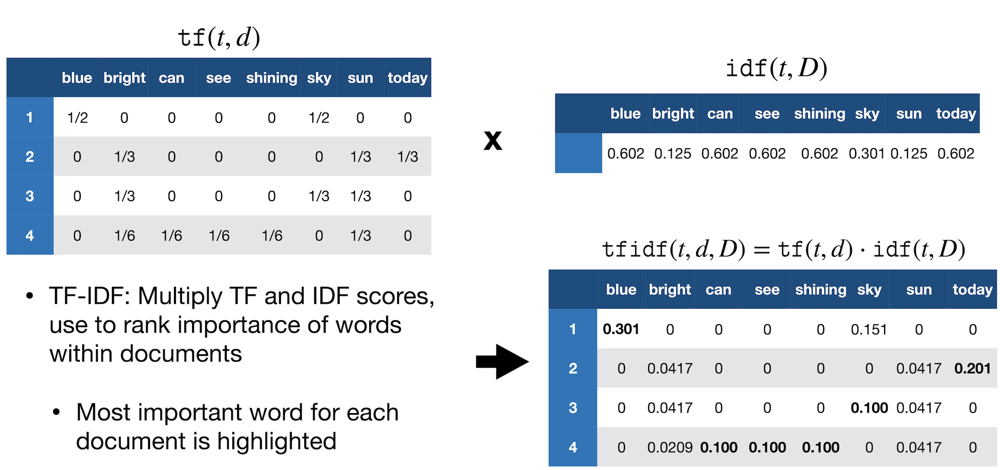

# Let's check the documentation of scikit-learn
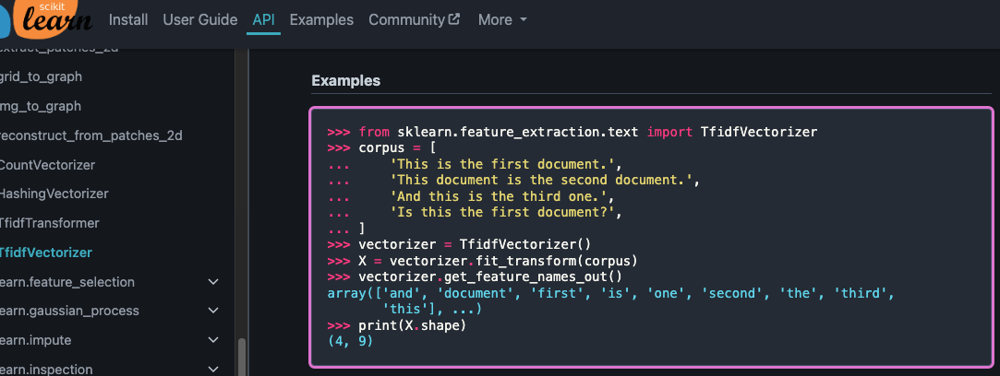

Here our corpus is all of our post data
so we should concat aggregate all of them and provide as a corpus to the Tf-IDF vectorizer of the scikit-learn.

In [126]:
import re
from sklearn.feature_extraction.text import TfidfVectorizer

# Sample list of Turkish stopwords for illustration (should be loaded from a predefined list)
turkish_stopwords = ["ve", "bir", "bu", "o", "için", "da", "de", "ama", "ile", "gibi"]  # add more as needed

def preprocess_text(text: str):
    # Lowercase the text
    text = text.casefold()

    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    # Remove special characters and punctuation (including emojis if needed)
    text = re.sub(r'[^a-zçğıöşü0-9\s#@]', '', text)

    # Remove numbers
    text = re.sub(r'\d+', '', text)

    # Remove extra whitespaces
    text = re.sub(r'\s+', ' ', text).strip()

    return text


# Prepare the training corpus and labels
corpus = []
train_usernames = []

for username, posts in username2posts_train.items():
    train_usernames.append(username)

    # Aggregating the posts per user
    cleaned_captions = []
    for post in posts:
        post_caption = post.get("caption", "")
        if post_caption is None:
            continue

        post_caption = preprocess_text(post_caption)

        if post_caption != "":
            cleaned_captions.append(post_caption)

    # Joining the posts of each user with a newline separator
    user_post_captions = "\n".join(cleaned_captions)
    corpus.append(user_post_captions)

# Initialize the TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words=turkish_stopwords, max_features=5000)

# Fit the vectorizer on the training corpus
vectorizer.fit(corpus)

# Transform the training data into TF-IDF vectors
x_post_train = vectorizer.transform(corpus)

# Create the labels for training
y_train = [username2_category.get(uname, "NA") for uname in train_usernames]


# Prepare the test corpus
test_usernames = []
test_corpus = []

for username, posts in username2posts_test.items():
    test_usernames.append(username)
    
    # Aggregating the posts per user
    cleaned_captions = []
    for post in posts:
        post_caption = post.get("caption", "")
        if post_caption is None:
            continue

        post_caption = preprocess_text(post_caption)

        if post_caption != "":
            cleaned_captions.append(post_caption)

    # Joining the posts of each user with a newline separator
    user_post_captions = "\n".join(cleaned_captions)
    test_corpus.append(user_post_captions)

# Transform the test data using the already fitted vectorizer (no fitting here!)
x_post_test = vectorizer.transform(test_corpus)


In [128]:
# Making sure everything is fine
assert y_train.count("NA") == 0

In [129]:
feature_names = vectorizer.get_feature_names_out()
feature_names

array(['abdullah', 'abone', 'about', ..., 'şık', 'şıklık', 'şıklığı'],
      dtype=object)

In [130]:
# Get the feature names (terms) from the vectorizer
feature_names = vectorizer.get_feature_names_out()

# Convert the sparse matrix to an array and create a DataFrame
df_tfidf = pd.DataFrame(x_post_train.toarray(), columns=feature_names)

# Display the first two rows of the DataFrame
df_tfidf.head(2)


,abdullah,abone,about,acaba,acele,acil,activities,acı,ad,ada,...,şubemiz,şubesi,şölen,şöleni,şöyle,şükranla,şükür,şık,şıklık,şıklığı
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050894,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0


In [131]:
df_tfidf.shape

(2741, 5000)

In [132]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(df_tfidf, y_train, test_size=0.2, stratify=y_train)

In [133]:
x_train.shape

(2192, 5000)

In [134]:
x_val.shape

(549, 5000)

# Naive Base Classifier

### Now we can pass the numerical values to a classifier, Let's try Naive Base!


In [135]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer

# Update the TfidfVectorizer with bigrams and more advanced settings
vectorizer = TfidfVectorizer(
    stop_words=turkish_stopwords,
    max_features=20000,           # Limit to 20000 most important words
    ngram_range=(1, 2),          # Use unigrams and bigrams
    min_df=5,                    # Remove terms that appear in less than 5 documents
    max_df=0.85,                 # Remove terms that appear in more than 85% of the documents
    sublinear_tf=True,           # Apply sublinear term frequency scaling (log(tf))
   
)

# Fit the vectorizer and transform the training data
x_post_train_tfidf = vectorizer.fit_transform(corpus)

# Define the Naive Bayes model
model = MultinomialNB()

# Use GridSearchCV to tune the 'alpha' parameter and potentially others
param_grid = {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 3.0, 5.0, 10.0], 
              'fit_prior': [True, False]}  # Trying different priors for better performance
grid_search = GridSearchCV(model, param_grid, cv=10, n_jobs=-1, verbose=1)
grid_search.fit(x_train, y_train)

# Get the best model and print results
best_model = grid_search.best_estimator_

# Train the best model
best_model.fit(x_train, y_train)

# Make predictions on the validation set
y_pred = best_model.predict(x_val)

# Evaluate the model
accuracy = accuracy_score(y_val, y_pred)
print(f"Validation Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(classification_report(y_val, y_pred))


Fitting 10 folds for each of 18 candidates, totalling 180 fits
Validation Accuracy: 0.6412
Classification Report:
                      precision    recall  f1-score   support

                 art       0.48      0.26      0.34        38
       entertainment       0.45      0.46      0.45        65
             fashion       0.68      0.67      0.67        60
                food       0.86      0.91      0.89       102
              gaming       0.00      0.00      0.00         3
health and lifestyle       0.59      0.67      0.63       100
    mom and children       0.61      0.37      0.46        30
              sports       0.81      0.57      0.67        23
                tech       0.62      0.68      0.65        69
              travel       0.58      0.69      0.63        59

            accuracy                           0.64       549
           macro avg       0.57      0.53      0.54       549
        weighted avg       0.64      0.64      0.63       549



c:\Users\aarda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aarda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\aarda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [149]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report

# Update TfidfVectorizer with more complex n-grams and more features
vectorizer = TfidfVectorizer(
    stop_words=None,           # Do not remove stopwords
    max_features=15000,        # Use up to 15,000 most important words
    ngram_range=(1, 4),        # Unigrams, bigrams, trigrams, and quadgrams
    min_df=1,                  # Remove no terms; keep everything
    max_df=1.0,                # Keep all terms, even the most common
    sublinear_tf=False          # Don't apply sublinear term frequency scaling
)

# Fit and transform training data
x_post_train_tfidf = vectorizer.fit_transform(corpus)

# Train Naive Bayes with very low alpha to reduce regularization
model = MultinomialNB(alpha=0.0001)

# Train the model
model.fit(x_train, y_train)

# Make predictions on the training set
y_train_pred = model.predict(x_train)

# Calculate training accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)

# Print training accuracy
print(f"Training Accuracy: {train_accuracy:.4f}")

# Print classification report
print("\nClassification Report for Training Data:")
print(classification_report(y_train, y_train_pred, zero_division=0))


Training Accuracy: 0.8668

Classification Report for Training Data:
                      precision    recall  f1-score   support

                 art       0.97      0.80      0.87       153
       entertainment       0.83      0.80      0.81       258
             fashion       0.85      0.92      0.88       239
                food       0.94      0.89      0.91       409
              gaming       1.00      1.00      1.00        10
health and lifestyle       0.81      0.86      0.83       402
    mom and children       0.91      0.86      0.88       119
              sports       0.99      0.91      0.95        90
                tech       0.87      0.93      0.90       277
              travel       0.78      0.82      0.80       235

            accuracy                           0.87      2192
           macro avg       0.89      0.88      0.88      2192
        weighted avg       0.87      0.87      0.87      2192



In [150]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# More complex feature extraction (bigrams and trigrams)
vectorizer = TfidfVectorizer(
    stop_words=None,               # Do not remove stopwords
    max_features=10000,            # Use up to 10,000 most important words
    ngram_range=(1, 3),            # Use unigrams, bigrams, and trigrams
    min_df=1,                      # Do not remove any terms based on frequency
    max_df=1.0,                    # Keep all terms, even the most common
    sublinear_tf=True              # Use sublinear term frequency scaling
)

# Fit the vectorizer and transform the training data
x_post_train_tfidf = vectorizer.fit_transform(corpus)


# Define the Naive Bayes model with a very small alpha (reducing regularization)
model = MultinomialNB(alpha=0.001)  # Lower alpha for overfitting

# Train the model
model.fit(x_train, y_train)

# Make predictions on the training set
y_train_pred = model.predict(x_train)

# Evaluate the model on the training set
print("Training Accuracy:", accuracy_score(y_train, y_train_pred))
print("\nTraining Classification Report:")
print(classification_report(y_train, y_train_pred, zero_division=0))

# Optionally, evaluate on the validation set (to monitor overfitting)
y_val_pred = model.predict(x_val)
print("\nValidation Accuracy:", accuracy_score(y_val, y_val_pred))
print("\nValidation Classification Report:")
print(classification_report(y_val, y_val_pred, zero_division=0))


Training Accuracy: 0.8608576642335767

Training Classification Report:
                      precision    recall  f1-score   support

                 art       0.96      0.78      0.86       153
       entertainment       0.83      0.79      0.81       258
             fashion       0.84      0.92      0.87       239
                food       0.94      0.89      0.91       409
              gaming       1.00      1.00      1.00        10
health and lifestyle       0.81      0.85      0.83       402
    mom and children       0.89      0.85      0.87       119
              sports       0.99      0.91      0.95        90
                tech       0.87      0.93      0.90       277
              travel       0.77      0.81      0.79       235

            accuracy                           0.86      2192
           macro avg       0.89      0.87      0.88      2192
        weighted avg       0.86      0.86      0.86      2192


Validation Accuracy: 0.6229508196721312

Validation Class

In [151]:
test_data_path = "test-classification-round1.dat"

# Check if the file exists
import os

if os.path.exists(test_data_path):
    print(f"File found: {test_data_path}")
    
    # Read and print the first 5 lines using Python
    print("First 5 lines of the file:")
    with open(test_data_path, "rt") as fh:
        for i, line in enumerate(fh):
            if i < 5:
                print(line.strip())
            else:
                break
else:
    print(f"File not found: {test_data_path}")

# Load the usernames into a list
test_unames = []
if os.path.exists(test_data_path):
    with open(test_data_path, "rt") as fh:
        for line in fh:
            test_unames.append(line.strip())

# Display the loaded usernames
print("*****")
print(f"Number of usernames loaded: {len(test_unames)}")
print(f"Sample usernames: {test_unames[:5]}")


File found: test-classification-round1.dat
First 5 lines of the file:
ozhotelstr
elleturkiye
sozerinsaatorhangazi
sanliurfapiazzaavym
rusanozden
*****
Number of usernames loaded: 1000
Sample usernames: ['ozhotelstr', 'elleturkiye', 'sozerinsaatorhangazi', 'sanliurfapiazzaavym', 'rusanozden']


In [152]:
# Convert test_usernames and train_usernames to dictionaries for faster lookups
test_usernames_dict = {uname: i for i, uname in enumerate(test_usernames)}
train_usernames_dict = {uname: i for i, uname in enumerate(train_usernames)}

x_test = []
missing_usernames = []  # To track usernames not found

# Debugging: Print the first few entries of each dictionary
print("First few entries in test_usernames_dict:")
for i, (uname, index) in enumerate(test_usernames_dict.items()):
    if i >= 5: break  # Limit to the first 5 entries
    print(f"{uname}: {index}")

print("\nFirst few entries in train_usernames_dict:")
for i, (uname, index) in enumerate(train_usernames_dict.items()):
    if i >= 5: break  # Limit to the first 5 entries
    print(f"{uname}: {index}")

# Processing the test usernames
for uname in test_unames:
    if uname in test_usernames_dict:
        index = test_usernames_dict[uname]
        x_test.append(x_post_test[index].toarray()[0])
    elif uname in train_usernames_dict:
        index = train_usernames_dict[uname]
        x_test.append(x_post_train[index].toarray()[0])
    else:
        missing_usernames.append(uname)

# Remove "screenname" if it exists in the test_unames list
if "screenname" in test_unames:
    test_unames.remove("screenname")

# Debugging: Print missing usernames
if missing_usernames:
    print("Usernames not found in either test or train datasets:")
    print(missing_usernames)
else:
    print("All usernames successfully processed.")


First few entries in test_usernames_dict:
beyazyakaliyiz: 0
totalenergies_istasyonlari: 1
konforyatak: 2
ht_kulup: 3
ajansspor: 4

First few entries in train_usernames_dict:
deparmedya: 0
kafesfirin: 1
vimerang: 2
mustafa_yalcinn38: 3
zorluenergysolutions: 4
Usernames not found in either test or train datasets:
['screenname']


In [154]:
import pandas as pd
import numpy as np

# Assuming 'vectorizer' is the trained vectorizer and 'test_corpus' is the test data

# Transform the test data using the same vectorizer used for training
x_test_tfidf = vectorizer.transform(test_corpus)

# Ensure the number of columns (features) in the test data matches the training data
if x_test_tfidf.shape[1] == len(feature_names):
    # Proceed to create the DataFrame if the number of columns matches
    df_test = pd.DataFrame(np.array(x_test_tfidf.toarray()), columns=feature_names)
    print(df_test.head(2))
else:
    # Handle the case where the number of features doesn't match
    print(f"Mismatch between x_test columns ({x_test_tfidf.shape[1]}) and feature names length ({len(feature_names)})")
    
    # Get the feature names from the training vectorizer's vocabulary
    vocab = vectorizer.get_feature_names_out()
    
    # If there are extra features in the test data, we'll align them
    # Transform test data to match the vocabulary of the training set
    x_test_tfidf_aligned = vectorizer.transform(test_corpus)
    
    # Create a DataFrame using the correct feature names
    df_test_aligned = pd.DataFrame(x_test_tfidf_aligned.toarray(), columns=vocab)
    
    # If you want to ensure both train and test data have the same number of columns, you can pad the test DataFrame
    # or align them manually using intersection of features
    print(df_test_aligned.head(2))


Mismatch between x_test columns (10000) and feature names length (5000)
    ab  abd  abdulkadir  abdullah  abi  abiye  abone  about  about the  abs  \
0  0.0  0.0         0.0       0.0  0.0    0.0    0.0    0.0        0.0  0.0   
1  0.0  0.0         0.0       0.0  0.0    0.0    0.0    0.0        0.0  0.0   

   ...  şöleni  şöyle  şükranla  şükranlarımızı  şükür  şık  şık bir  şık ve  \
0  ...     0.0    0.0       0.0        0.000000    0.0  0.0      0.0     0.0   
1  ...     0.0    0.0       0.0        0.048726    0.0  0.0      0.0     0.0   

   şıklık  şıklığı  
0     0.0      0.0  
1     0.0      0.0  

[2 rows x 10000 columns]


In [155]:
from sklearn.feature_extraction.text import TfidfVectorizer
import json
from collections import Counter

# Ensure vectorizer uses the same settings during both training and prediction
vectorizer = TfidfVectorizer(
    stop_words=None,               # Do not remove stopwords
    max_features=5000,             # Use the same 5000 most important words
    ngram_range=(1, 3),            # Use unigrams, bigrams, and trigrams
    min_df=1,                      # Do not remove any terms based on frequency
    max_df=1.0,                    # Keep all terms, even the most common
    sublinear_tf=True              # Use sublinear term frequency scaling
)

# 1. Fit the vectorizer using the training data
print("Fitting vectorizer on training data...")
vectorizer.fit(corpus)  # Fit the vectorizer on your training data
print("Vectorizer fitting complete.")

# 2. Transform the test data using the fitted vectorizer
print("Transforming test data...")
x_test_array = vectorizer.transform(test_corpus).toarray()
print(f"Test data transformed. Shape: {x_test_array.shape}")

# 3. Validate feature alignment with the trained model
if x_test_array.shape[1] != model.n_features_in_:
    raise ValueError(f"Feature mismatch: the model expects {model.n_features_in_} features, "
                     f"but the test data has {x_test_array.shape[1]} features.")

# 4. Predict using the trained model
print("Predicting test data...")
test_pred = model.predict(x_test_array)

# Debugging: Verify predictions
print(f"Number of predictions: {len(test_pred)}")
print(f"Sample predictions: {test_pred[:5]}")
print(f"Prediction distribution: {Counter(test_pred)}")

# 5. Ensure the predictions correspond to the usernames in 'test_unames'
# Mapping predictions to the respective usernames
print("Mapping predictions to usernames...")
output = {uname: test_pred[i] for i, uname in enumerate(test_unames)}

# Debugging: Verify output dictionary
print(f"Number of items in output: {len(output)}")
print(f"Sample output: {list(output.items())[:5]}")

# 6. Write the full JSON file without truncation
output_filename = "prediction-classification-round1.json"
print(f"Writing predictions to file: {output_filename}...")
with open(output_filename, "w", encoding="utf-8") as of:
    json.dump(output, of, indent=4, ensure_ascii=False)
print("File writing complete.")

# Verification step: Check file content size
print("Verifying written file...")
with open(output_filename, "r", encoding="utf-8") as f:
    content = f.read()
    print(f"File size: {len(content)} characters")
    print(f"First 500 characters of the file:\n{content[:500]}")

print(f"Predictions successfully written to {output_filename} with {len(output)} items.")


Fitting vectorizer on training data...
Vectorizer fitting complete.
Transforming test data...
Test data transformed. Shape: (2674, 5000)
Predicting test data...
Number of predictions: 2674
Sample predictions: ['health and lifestyle' 'health and lifestyle' 'health and lifestyle'
 'health and lifestyle' 'travel']
Prediction distribution: Counter({np.str_('health and lifestyle'): 2231, np.str_('food'): 187, np.str_('travel'): 134, np.str_('entertainment'): 50, np.str_('tech'): 48, np.str_('art'): 11, np.str_('fashion'): 11, np.str_('sports'): 1, np.str_('mom and children'): 1})
Mapping predictions to usernames...
Number of items in output: 999
Sample output: [('ozhotelstr', np.str_('health and lifestyle')), ('elleturkiye', np.str_('health and lifestyle')), ('sozerinsaatorhangazi', np.str_('health and lifestyle')), ('sanliurfapiazzaavym', np.str_('health and lifestyle')), ('rusanozden', np.str_('travel'))]
Writing predictions to file: prediction-classification-round1.json...
File writing c

c:\Users\aarda\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MultinomialNB was fitted with feature names
  warnings.warn(


In [50]:
with open("prediction-classification-round1.json", "w") as of:
  json.dump(output, of, indent=4)

# Like Count Prediction


Here, we use the average like_count of the user's previous posts to predict each post's like_count

In [66]:
def predict_like_count(username, current_post=None):
    def get_avg_like_count(posts):
        """
        Calculate the average like count for a user's posts, excluding the current post if provided.
        """
        if not posts:
            return 0.0  # No posts available, return 0
        
        total_likes = 0
        valid_post_count = 0
        
        for post in posts:
            # Skip the current post if provided
            if current_post and post.get("id") == current_post.get("id"):
                continue
            
            like_count = post.get("like_count", 0) or 0  # Default to 0 if like_count is None
            total_likes += like_count
            valid_post_count += 1

        # Avoid division by zero
        return total_likes / valid_post_count if valid_post_count > 0 else 0.0

    # Check if username exists in train or test datasets
    if username in username2posts_train:
        return get_avg_like_count(username2posts_train[username])
    elif username in username2posts_test:
        return get_avg_like_count(username2posts_test[username])
    else:
        print(f"No data available for username: {username}")
        return -1  # Indicate that prediction couldn't be made


In [67]:
def log_mse_like_counts(y_true, y_pred):
    """
    Calculate the Log Mean Squared Error (Log MSE) for like counts.

    Applies a log transformation: log(like_count + 1) to handle non-negative like counts.

    Parameters:
    - y_true: array-like, actual like counts (must be non-negative)
    - y_pred: array-like, predicted like counts (must be non-negative)

    Returns:
    - log_mse: float, Log Mean Squared Error
    """
    # Ensure inputs are numpy arrays
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    # Check for negative values and handle gracefully
    if np.any(y_true < 0) or np.any(y_pred < 0):
        raise ValueError("Like counts must be non-negative.")

    # Log transformation: log(like_count + 1)
    log_y_true = np.log1p(y_true)
    log_y_pred = np.log1p(y_pred)

    # Compute squared errors
    squared_errors = (log_y_true - log_y_pred) ** 2

    # Return the mean of squared errors
    log_mse = np.mean(squared_errors)
    return log_mse


In [69]:
def evaluate_like_count(data_dict, dataset_name="Train"):
    """
    Evaluate the Log Mean Squared Error (Log MSE) for like count predictions on a given dataset.

    Parameters:
    - data_dict: dict, mapping of usernames to their posts.
    - dataset_name: str, name of the dataset (e.g., "Train" or "Test").

    Returns:
    - log_mse: float, Log Mean Squared Error for the dataset.
    """
    true_counts = []
    predicted_counts = []

    for username, posts in data_dict.items():
        for post in posts:
            # Predict like count for the post
            predicted_like = predict_like_count(username, post)
            # Actual like count (default to 0 if None)
            actual_like = post.get("like_count", 0) or 0

            # Collect predictions and ground truths
            true_counts.append(actual_like)
            predicted_counts.append(predicted_like)

    # Calculate Log MSE
    log_mse = log_mse_like_counts(true_counts, predicted_counts)
    print(f"Log MSE ({dataset_name}): {log_mse}")
    return log_mse

# Evaluate on the training dataset
evaluate_like_count(username2posts_train, dataset_name="Train")


Log MSE (Train): 1.2458993938898006


np.float64(1.2458993938898006)

In [97]:
import json

def predict_like_count_for_test_dataset(input_path, output_path):
    """
    Predict the like counts for posts in the test dataset and save the predictions to a new file.
    """
    output_list = []

    # Open the input file and print out the first few lines to check the structure
    with open(input_path, "r") as fh:
        for line_num, line in enumerate(fh):
            if line_num < 5:  # Let's print the first 5 lines for inspection
                print(f"Line {line_num}: {line.strip()}")  # Print the first few lines for structure check

            try:
                sample = json.loads(line)
                
                # Check if the sample is a list or dict
                if isinstance(sample, list):
                    print(f"Line {line_num}: Sample is a list of length {len(sample)}")
                    for post in sample:  # If sample is a list, process each post
                        print(f"Processing post: {post}")
                        username = post.get("username")
                        if username:
                            predicted_like_count = predict_like_count(username)
                            post["like_count"] = int(predicted_like_count)
                            output_list.append(post)
                        else:
                            print(f"Warning: No username found in post: {post}")
                elif isinstance(sample, dict):
                    print(f"Line {line_num}: Sample is a dict: {sample}")
                    username = sample.get("username")
                    if username:
                        predicted_like_count = predict_like_count(username)
                        sample["like_count"] = int(predicted_like_count)
                        output_list.append(sample)
                    else:
                        print(f"Warning: No username found in sample: {sample}")
                else:
                    print(f"Warning: Unexpected data structure {type(sample)} in line: {line}")
            except json.JSONDecodeError:
                print(f"Error decoding line: {line}")

    # If output_list is still empty, check the reason
    if not output_list:
        print("Warning: No data processed. Output list is empty.")
    else:
        # Write the predictions to the output file
        with open(output_path, "w") as of:
            json.dump(output_list, of, indent=4)
            print(f"Predictions saved to {output_path}")

# Paths to the test data and the output file
input_path = "test-regression-round1.jsonl"
output_path = "test-regression-round1-output.jsonl"

# Predict and save results
predict_like_count_for_test_dataset(input_path, output_path)


Line 0: {"caption": "KOZA 2023 2.si Damla\u2019n\u0131n koleksiyonu, Latincede \u2018Memento Mori\u2019 olarak bilinen \u2018\u00f6l\u00fcml\u00fc oldu\u011funu hat\u0131rla\u2019 anlam\u0131ndaki ifadeden esinleniyor. Koleksiyon, hayat\u0131n ve \u00f6l\u00fcm\u00fcn, para, i\u015f\u00e7i, kral ve krali\u00e7e kavramlar\u0131 \u00fczerinden yarat\u0131c\u0131 g\u00f6r\u00fcn\u00fcmlerle bir araya getirilmesini ama\u00e7l\u0131yor. \u00d6l\u00fcm sembollerinden esinlenen desenler kullanan Damla, \u201cka\u011f\u0131t par\u00e7as\u0131ndan ibaret olmak\u201d kavram\u0131n\u0131 vurguluyor. Koleksiyon, ya\u015fam\u0131n ve \u00f6l\u00fcm\u00fcn ayn\u0131 anda ifade edilmesini hedefliyor; k\u0131rm\u0131z\u0131 ve mavi \u0131\u015f\u0131klarla veya g\u00f6zl\u00fcklerle g\u00f6r\u00fclen hologram efekti kullan\u0131larak bu konsept sahneye ta\u015f\u0131n\u0131yor. K\u0131rm\u0131z\u0131 renk \u00f6l\u00fcm\u00fc, mavi ise ya\u015fam\u0131 simgeliyor. Koleksiyon, ofis giyimlerinden esinle

In [99]:
from pprint import pprint
import json
from pprint import pprint

def predict_like_count_for_test_dataset(input_path, output_path):
    """
    Predict the like counts for posts in the test dataset and save the predictions to a new file.
    """
    output_list = []

    # Open the input file and print out the first few lines to check the structure
    with open(input_path, "r") as fh:
        for line_num, line in enumerate(fh):
            if line_num < 5:  # Let's print the first 5 lines for inspection
                print(f"Line {line_num}: {line.strip()}")  # Print the first few lines for structure check

            try:
                # Parse the line to JSON
                sample = json.loads(line)
                print(f"Line {line_num}: Parsed sample: {sample}")  # Debug: print the parsed sample

                # Check if the sample is a list or dict
                if isinstance(sample, list):
                    print(f"Line {line_num}: Sample is a list of length {len(sample)}")
                    for post in sample:  # If sample is a list, process each post
                        print(f"Processing post: {post}")  # Debug: print the post
                        username = post.get("username")
                        if username:
                            predicted_like_count = predict_like_count(username)
                            post["like_count"] = int(predicted_like_count)
                            output_list.append(post)
                        else:
                            print(f"Warning: No username found in post: {post}")
                elif isinstance(sample, dict):
                    print(f"Line {line_num}: Sample is a dict: {sample}")
                    username = sample.get("username")
                    if username:
                        predicted_like_count = predict_like_count(username)
                        sample["like_count"] = int(predicted_like_count)
                        output_list.append(sample)
                    else:
                        print(f"Warning: No username found in sample: {sample}")
                else:
                    print(f"Warning: Unexpected data structure {type(sample)} in line: {line}")
            except json.JSONDecodeError:
                print(f"Error decoding line: {line}")

    # If output_list is still empty, check the reason
    if not output_list:
        print("Warning: No data processed. Output list is empty.")
    else:
        # Write the predictions to the output file
        with open(output_path, "w") as of:
            json.dump(output_list, of, indent=4)
            print(f"Predictions saved to {output_path}")

# Paths to the test data and the output file
input_path = "test-regression-round1.jsonl"
output_path = "test-regression-round1-output.jsonl"

# Predict and save results
predict_like_count_for_test_dataset(input_path, output_path)

# Print the first 3 items in output_list
pprint(output_list[:3])


Line 0: {"caption": "KOZA 2023 2.si Damla\u2019n\u0131n koleksiyonu, Latincede \u2018Memento Mori\u2019 olarak bilinen \u2018\u00f6l\u00fcml\u00fc oldu\u011funu hat\u0131rla\u2019 anlam\u0131ndaki ifadeden esinleniyor. Koleksiyon, hayat\u0131n ve \u00f6l\u00fcm\u00fcn, para, i\u015f\u00e7i, kral ve krali\u00e7e kavramlar\u0131 \u00fczerinden yarat\u0131c\u0131 g\u00f6r\u00fcn\u00fcmlerle bir araya getirilmesini ama\u00e7l\u0131yor. \u00d6l\u00fcm sembollerinden esinlenen desenler kullanan Damla, \u201cka\u011f\u0131t par\u00e7as\u0131ndan ibaret olmak\u201d kavram\u0131n\u0131 vurguluyor. Koleksiyon, ya\u015fam\u0131n ve \u00f6l\u00fcm\u00fcn ayn\u0131 anda ifade edilmesini hedefliyor; k\u0131rm\u0131z\u0131 ve mavi \u0131\u015f\u0131klarla veya g\u00f6zl\u00fcklerle g\u00f6r\u00fclen hologram efekti kullan\u0131larak bu konsept sahneye ta\u015f\u0131n\u0131yor. K\u0131rm\u0131z\u0131 renk \u00f6l\u00fcm\u00fc, mavi ise ya\u015fam\u0131 simgeliyor. Koleksiyon, ofis giyimlerinden esinle

In [ ]:
import json

def predict_like_count_for_test_dataset(input_path, output_path):
    """
    Predict the like counts for posts in the test dataset and save the predictions to a new file.
    """
    output_list = []

    # Open the input file and print out the first few lines to check the structure
    with open(input_path, "r") as fh:
        for line_num, line in enumerate(fh):
            if line_num < 5:  # Let's print the first 5 lines for inspection
                print(f"Line {line_num}: {line.strip()}")  # Print the first few lines for structure check

            try:
                sample = json.loads(line)
                
                # Check if the sample is a list or dict
                if isinstance(sample, list):
                    print(f"Line {line_num}: Sample is a list of length {len(sample)}")
                    for post in sample:  # If sample is a list, process each post
                        print(f"Processing post: {post}")
                        username = post.get("username")
                        if username:
                            predicted_like_count = predict_like_count(username)
                            post["like_count"] = int(predicted_like_count)
                            output_list.append(post)
                        else:
                            print(f"Warning: No username found in post: {post}")
                elif isinstance(sample, dict):
                    print(f"Line {line_num}: Sample is a dict: {sample}")
                    username = sample.get("username")
                    if username:
                        predicted_like_count = predict_like_count(username)
                        sample["like_count"] = int(predicted_like_count)
                        output_list.append(sample)
                    else:
                        print(f"Warning: No username found in sample: {sample}")
                else:
                    print(f"Warning: Unexpected data structure {type(sample)} in line: {line}")
            except json.JSONDecodeError:
                print(f"Error decoding line: {line}")

    # If output_list is still empty, check the reason
    if not output_list:
        print("Warning: No data processed. Output list is empty.")
    else:
        # Write the predictions to the output file
        with open(output_path, "w") as of:
            json.dump(output_list, of, indent=4)
            print(f"Predictions saved to {output_path}")

# Paths to the test data and the output file
input_path = "test-regression-round1.jsonl"
output_path = "test-regression-round1-output.jsonl"

# Predict and save results
predict_like_count_for_test_dataset(input_path, output_path)


Line 0: {"caption": "KOZA 2023 2.si Damla\u2019n\u0131n koleksiyonu, Latincede \u2018Memento Mori\u2019 olarak bilinen \u2018\u00f6l\u00fcml\u00fc oldu\u011funu hat\u0131rla\u2019 anlam\u0131ndaki ifadeden esinleniyor. Koleksiyon, hayat\u0131n ve \u00f6l\u00fcm\u00fcn, para, i\u015f\u00e7i, kral ve krali\u00e7e kavramlar\u0131 \u00fczerinden yarat\u0131c\u0131 g\u00f6r\u00fcn\u00fcmlerle bir araya getirilmesini ama\u00e7l\u0131yor. \u00d6l\u00fcm sembollerinden esinlenen desenler kullanan Damla, \u201cka\u011f\u0131t par\u00e7as\u0131ndan ibaret olmak\u201d kavram\u0131n\u0131 vurguluyor. Koleksiyon, ya\u015fam\u0131n ve \u00f6l\u00fcm\u00fcn ayn\u0131 anda ifade edilmesini hedefliyor; k\u0131rm\u0131z\u0131 ve mavi \u0131\u015f\u0131klarla veya g\u00f6zl\u00fcklerle g\u00f6r\u00fclen hologram efekti kullan\u0131larak bu konsept sahneye ta\u015f\u0131n\u0131yor. K\u0131rm\u0131z\u0131 renk \u00f6l\u00fcm\u00fc, mavi ise ya\u015fam\u0131 simgeliyor. Koleksiyon, ofis giyimlerinden esinle

In [110]:
import json

# File paths
path = "test-regression-round1.jsonl"
output_path = "prediction-regression-round1.json"

# Output dictionary
output_dict = {}

# Process the test data and make predictions
with open(path, "rt") as fh:
    for line in fh:
        sample = json.loads(line)

        # Get the predicted like count for the user
        pred_val = predict_like_count(sample["username"])

        # Store the predicted like count with post_id as the key
        post_id = sample["id"]
        output_dict[post_id] = int(pred_val)

# Write the output to a JSON file in the expected format
with open(output_path, "wt") as of:
    json.dump(output_dict, of, indent=4)

# Output preview (optional)
print(f"Sample output saved to {output_path}")



Sample output saved to prediction-regression-round1.json
